In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

batch_size = 100
train_dataset = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.11MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]
100%|██████████| 1.65M/1.65M [00:06<00:00, 247kB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.38MB/s]


In [ ]:

class Generator(nn.Module):
    def __init__(self, z_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 28*28),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z).view(-1, 1, 28, 28)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(28*28, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


In [ ]:
z_dim = 100
generator = Generator(z_dim).to(device)
discriminator = Discriminator().to(device)


In [ ]:
loss_fn = nn.BCELoss()
lr = 0.0002
g_optimizer = optim.Adam(generator.parameters(), lr=lr)
d_optimizer = optim.Adam(discriminator.parameters(), lr=lr)

In [ ]:
epochs = 100
fixed_noise = torch.randn(25, z_dim, device=device)
d_losses, g_losses = [], []

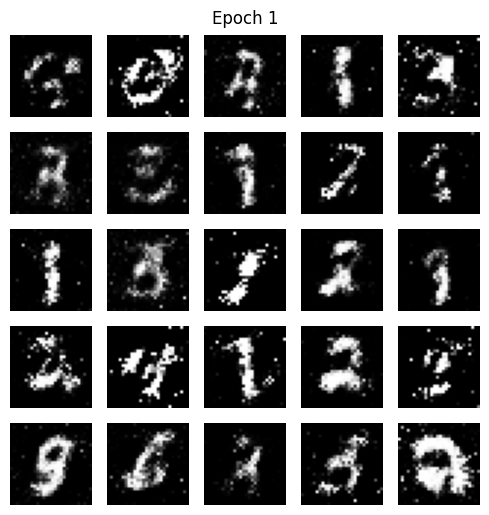

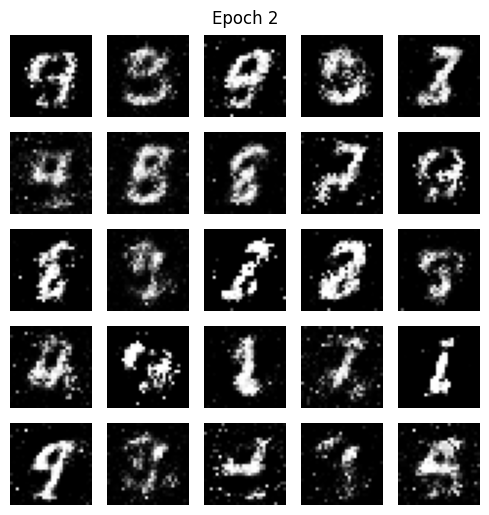

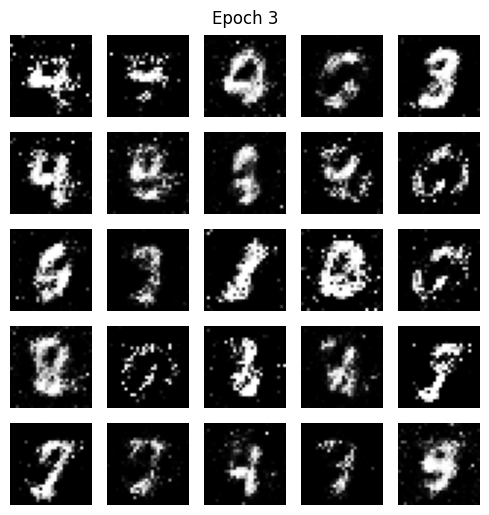

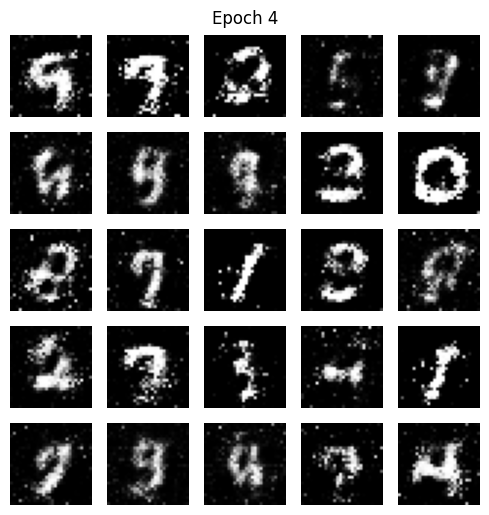

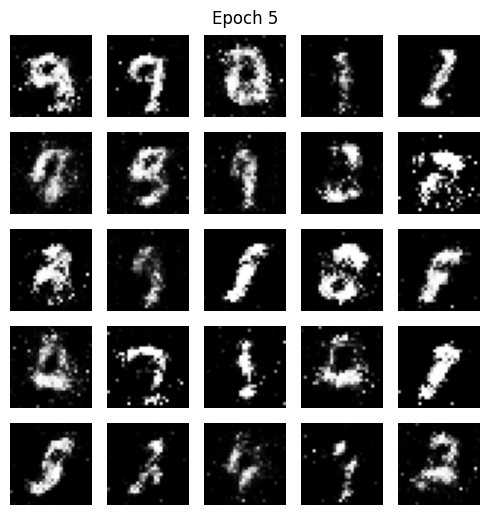

...

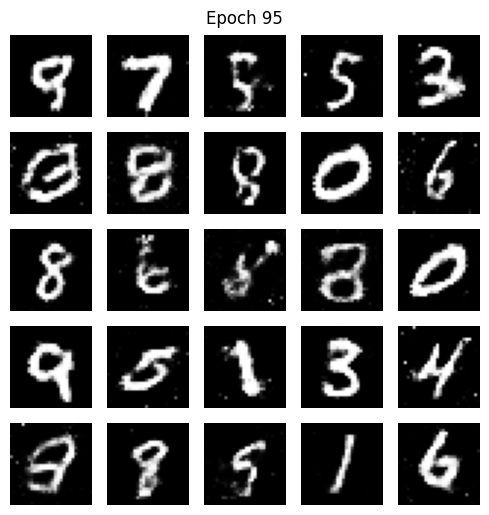

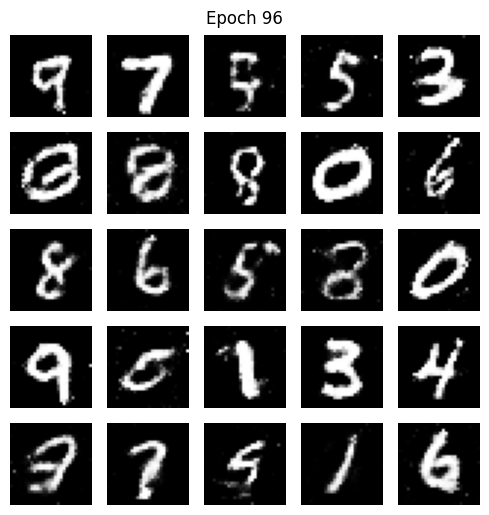

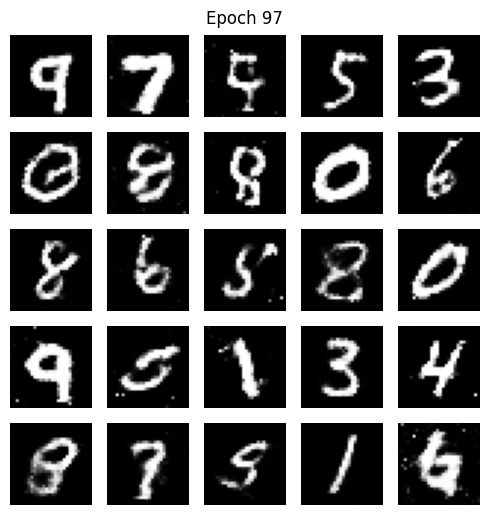

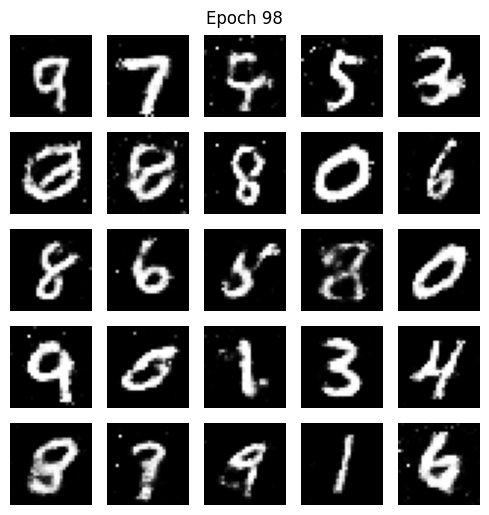

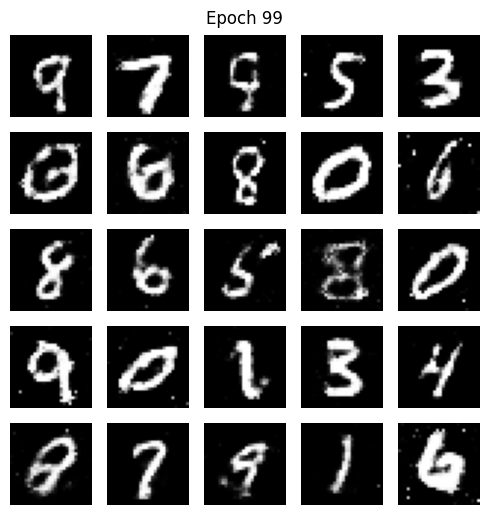

In [ ]:
for epoch in range(epochs):
    d_loss_epoch, g_loss_epoch = 0.0, 0.0
    for real_imgs, _ in train_loader:
        real_imgs = real_imgs.to(device)
        real_labels = torch.ones(real_imgs.size(0), 1, device=device)
        fake_labels = torch.zeros(real_imgs.size(0), 1, device=device)

        z = torch.randn(real_imgs.size(0), z_dim, device=device)
        fake_imgs = generator(z)
        d_real = discriminator(real_imgs)
        d_fake = discriminator(fake_imgs.detach())

        d_loss_real = loss_fn(d_real, real_labels)
        d_loss_fake = loss_fn(d_fake, fake_labels)
        d_loss = d_loss_real + d_loss_fake

        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        z = torch.randn(real_imgs.size(0), z_dim, device=device)
        fake_imgs = generator(z)
        d_fake = discriminator(fake_imgs)
        g_loss = loss_fn(d_fake, real_labels)

        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        d_loss_epoch += d_loss.item()
        g_loss_epoch += g_loss.item()

    d_losses.append(d_loss_epoch / len(train_loader))
    g_losses.append(g_loss_epoch / len(train_loader))

    with torch.no_grad():
        generated_imgs = generator(fixed_noise).cpu().numpy()
        fig, axes = plt.subplots(5, 5, figsize=(5, 5))
        for i, ax in enumerate(axes.flatten()):
            ax.imshow(generated_imgs[i][0], cmap='gray')
            ax.axis('off')
        plt.tight_layout()
        plt.suptitle(f"Epoch {epoch+1}", y=1.02)
        plt.show()

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(d_losses, label='Discriminator Loss')
plt.plot(g_losses, label='Generator Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.title("Training Losses")
plt.show()